In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense,Conv1D,MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score


In [ ]:
fake = pd.read_csv('Fake.csv')
fake.head()

In [8]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [9]:
fake['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


<Axes: xlabel='subject', ylabel='count'>

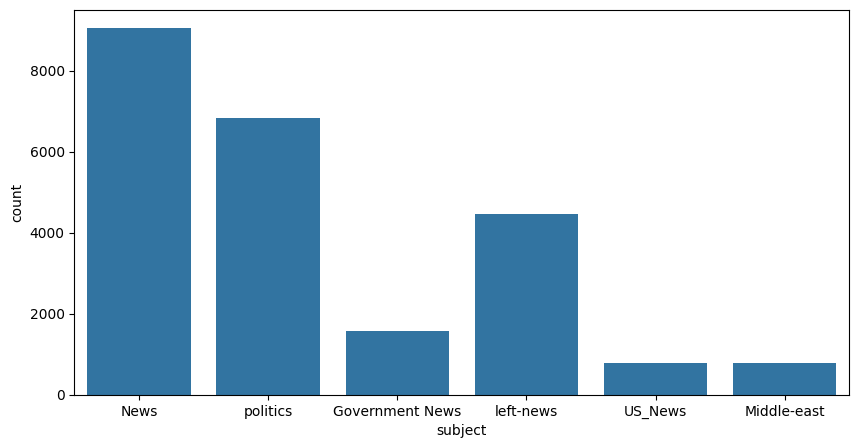

In [ ]:
plt.figure(figsize = (10,5))
sns.countplot(data = fake, x = 'subject')

WordCloud

In [10]:
text = ''.join(fake['text'].tolist())

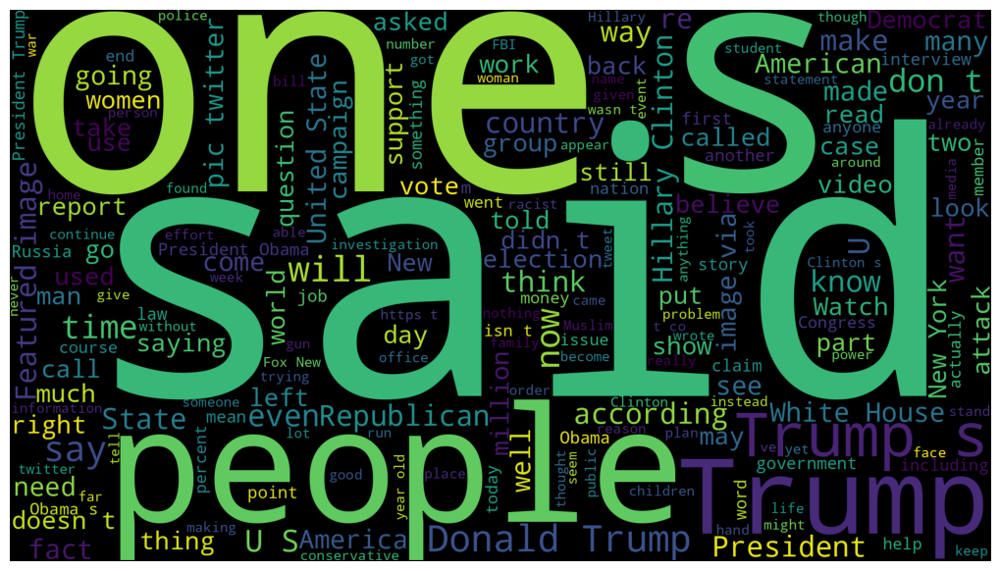

In [ ]:
wordcloud = WordCloud(width = 1920,height=1080).generate(text)
fig = plt.figure(figsize = (10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)
plt.show()


Exploring real dataset

In [ ]:
true = pd.read_csv('True.csv')
true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [12]:
true.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [13]:
true ['subject'].value_counts()

,count
subject,
politicsNews,11272
worldnews,10145


<Axes: xlabel='subject', ylabel='count'>

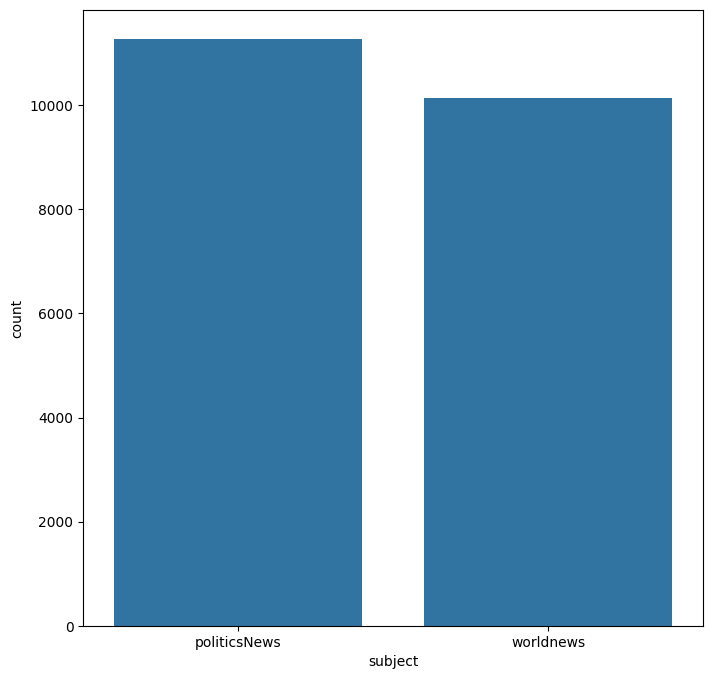

In [ ]:
plt.figure(figsize = (8,8))
sns.countplot(data = true, x = 'subject')

In [14]:
text = ''.join(true['text'].tolist())

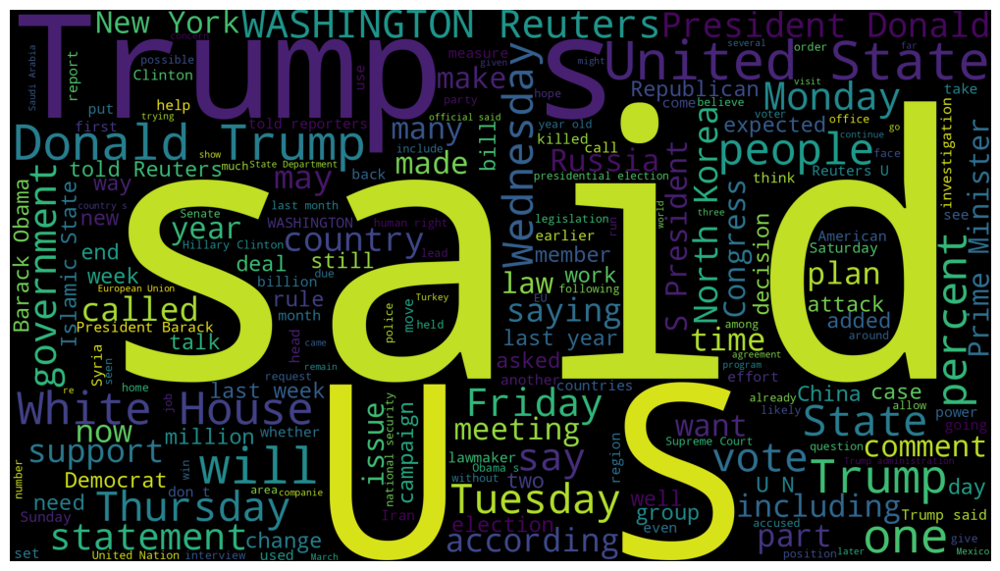

In [ ]:
wordcloud = WordCloud(width = 1920,height=1080).generate(text)
fig = plt.figure(figsize = (10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad = 0)
plt.show()

Observations & Differences:
**Fake News Word Cloud**

1) Uses more sensational, emotional, and vague words like "attack," "believed," "think," "show," and "watch."

2) Contains more subjective and speculative words, such as "doesn’t," "might," "put," "trying."

3) Mentions people in a generic way ("people," "man," "group") rather than citing official sources.

4) Has words suggesting uncertainty or opinion ("thought," "told," "saying," "read," "called.")

**Real News Word Cloud**

1) Contains more formal, factual, and structured words like "statement," "government," "percent," "meeting," "law."

2) Uses specific days ("Monday," "Thursday," "Friday") and official sources ("Reuters," "White House," "Prime Minister.")

3) Focuses on political and international topics ("Russia," "North Korea," "Senate," "vote," "decision.")

4) Avoids uncertain language and instead presents concrete details ("bill," "measure," "official," "Congress.")

Cleaning of the data


In [15]:
true.sample(5)

,title,text,subject,date
11347,"Twenty-eight arrests after Venezuela looting, ...","PUERTO ORDAZ, Venezuela (Reuters) - Venezuelan...",worldnews,"December 26, 2017"
18740,Energised challenge by Tokyo governor exposes ...,TOKYO (Reuters) - A fast-growing challenge by ...,worldnews,"September 29, 2017"
20491,Irma makes landfall at Cudjoe Key in lower Flo...,(Reuters) - The center of Hurricane Irma made ...,worldnews,"September 10, 2017"
6432,Russia has tried to influence elections in 'co...,WASHINGTON (Reuters) - Russia has tried to inf...,politicsNews,"January 10, 2017"
21351,Russian nuclear bombers fly near North Korea i...,MOSCOW (Reuters) - Russian nuclear-capable str...,worldnews,"August 24, 2017"


1. It loops through each text value in the true dataset.

2. Splits the text at the first - (dash), assuming the first part is the publisher's name.

3. If the first part is too long (>260 characters), it assumes there's no valid publisher.

4. If an error occurs (e.g., no - in the text), it catches it and adds the index to unknown_publishers.

In [16]:
unknown_publishers = []
for index, row in enumerate(true.text.values):
  try:
    record = row.split(' - ', maxsplit=1)
    record[1]

    assert(len(record[0]) < 120)
  except:
    unknown_publishers.append(index)

In [17]:
true.text.values

array(['WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non-defense “discretionary” spending on programs that support

In [18]:
len(unknown_publishers)

229

**text data which have the unknown_publishers**

In [19]:
true.iloc[unknown_publishers].text

,text
7,The following statements were posted to the ve...
8,The following statements were posted to the ve...
12,The following statements were posted to the ve...
13,The following statements were posted to the ve...
14,"(In Dec. 25 story, in second paragraph, corre..."
...,...
20135,(Story corrects to million from billion in pa...
20500,"(This Sept 8 story corrects headline, clarifi..."
20667,"(Story refiles to add dropped word not , in ..."
21246,(Story corrects third paragraph to show Mosul...


In [20]:
true.iloc[8970]

,8970
title,Graphic: Supreme Court roundup
text,
subject,politicsNews
date,"June 16, 2016"


In [21]:
true.drop(8970, inplace = True)

In [23]:
publisher = []
temp_text = []

for index, row in enumerate(true.text.values):
  if index  in unknown_publishers:
    temp_text.append(row)
    publisher.append('Unknown')
  else:
    record = row.split(' - ', maxsplit=1)
    publisher.append(record[0])
    temp_text.append(record[1])

IndexError: list index out of range

In [24]:
true['publisher'] = publisher
true['text'] = temp_text


ValueError: Length of values (9008) does not match length of index (21416)

In [25]:
true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [26]:
true.shape


(21416, 4)

**now  cleaning in false dataset**

In [27]:
empty_fake_index =  [index for index,text in enumerate(fake.text.to_list()) if str(text).strip()==""]

**fake data without the text**

In [28]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [29]:
true['text'] = true['title'] + " " + true['text']
fake['text'] = fake['title'] + " " + fake['text']

In [30]:
true['text'] = true['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

**Preprocessing of the text**

In [31]:
true['class'] = 1
fake['class'] = 0

In [32]:
true.columns

Index(['title', 'text', 'subject', 'date', 'class'], dtype='object')

In [33]:
true = true[['text','class']]

In [34]:
fake = fake[['text','class']]

**Appending the true and fake **

In [35]:
data = pd.concat([true, fake], ignore_index=True)

In [36]:
data

,text,class
0,"as u.s. budget fight looms, republicans flip t...",1
1,u.s. military to accept transgender recruits o...,1
2,senior u.s. republican senator: 'let mr. muell...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge 'much mor...,1
...,...,...
44892,mcpain: john mccain furious that iran treated ...,0
44893,justice? yahoo settles e-mail privacy class-ac...,0
44894,sunnistan: us and allied ‘safe zone’ plan to t...,0
44895,how to blow $700 million: al jazeera america f...,0


In [37]:
data.sample(6)

,text,class
35350,game changer: how trump is bringing back the “...,0
25239,trump’s inner circle is busily making revenge...,0
24834,breaking: trump is now directly threatening e...,0
43330,political hack rihanna sings “we are the new a...,0
37284,why is the presence of russian aircraft fighte...,0
20897,china brushes off vietnam protests over south ...,1


**we need to remove the special character from the data fro that we need to use kgptalkie preprocessor package**

In [ ]:
# https://github.com/laxmimerit/preprocess_kgptalkie

In [1]:
!pip install -U spacy
!python -m spacy download en_core_web_sm
!pip install -U beautifulsoup4
!pip install -U textblob
!pip install --no-cache-dir git+https://github.com/laxmimerit/preprocess_kgptalkie.git


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 52.2 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.
  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-d0ihnzo2
  Running command git clone --filter=blob:none --quiet https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip-req-build-d0ihnzo2
  Resolved https://github.com/laxmimerit/preprocess_kgptalkie.git to commit 0f56a6502679f6750b7f0ffed98f590d1f0246bd
  Preparing metadata (setup.py) ... done
  Created wheel for preprocess_kgptalkie: filename=preprocess_kgptalkie-0.11-py3-none-any.whl size=8175 sha256=13fba6d5b2d37214e4d5c0635a46aac8b725f60c638c9c7d31d3c4d41b32ad1d
  Stored in dir

In [38]:
import preprocess_kgptalkie as ps

In [2]:
!pip install googletrans==4.0.0-rc1


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.5 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17397 sha256=493a8a4994dbd3bc76fcc29568c97fe3d2bc936aa13c95353d08365a861d9031
  Stored in directory: /root/.cache/pip/wheels/39/17/6f/66a045ea3d168826074691b4b787b8f324d3f646d755443fda
Successfully built googletrans
  Attempting uninstall: hyperframe
    Found existing installation: hyperframe 6.1.0
    Uninstalling hyperfram

**to remove special character**

In [39]:
data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [40]:
data['text']

,text
0,as us budget fight looms republicans flip thei...
1,us military to accept transgender recruits on ...
2,senior us republican senator let mr mueller do...
3,fbi russia probe helped by australian diplomat...
4,trump wants postal service to charge much more...
...,...
44892,mcpain john mccain furious that iran treated u...
44893,justice yahoo settles email privacy classactio...
44894,sunnistan us and allied safe zone plan to take...
44895,how to blow 700 million al jazeera america fin...


In [41]:
data

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1
...,...,...
44892,mcpain john mccain furious that iran treated u...,0
44893,justice yahoo settles email privacy classactio...,0
44894,sunnistan us and allied safe zone plan to take...,0
44895,how to blow 700 million al jazeera america fin...,0


now we have convert the text data into the numberical form for this we have to use **Vectorization**

**we have gensim librarie for vectorizatioin**

In [7]:
!pip install --upgrade --force-reinstall numpy gensim



  Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.1 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached smart_open-7.1.0-py3-none-any.whl.metadata (24 kB)
  Using cached wrapt-1.17.2-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.4 kB)
Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (26.7 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (38.6 MB)
Using cached smart_open-7.1.0-py3-none-any.whl (61 kB)
Using cached wrapt-1.17.2-cp311-cp

In [1]:
import gensim


In [112]:
y = data['class'].values

In [113]:
data['text'].tolist()

['as us budget fight looms republicans flip their fiscal script washington reuters  the head of a conservative republican faction in the us congress who voted this month for a huge expansion of the national debt to pay for tax cuts called himself a fiscal conservative on sunday and urged budget restraint in 2018 in keeping with a sharp pivot under way among republicans us representative mark meadows speaking on cbs face the nation drew a hard line on federal spending which lawmakers are bracing to do battle over in january when they return from the holidays on wednesday lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues such as immigration policy even as the november congressional election campaigns approach in which republicans will seek to keep control of congress president donald trump and his republicans want a big budget increase in military spending while democrats also want proportional increases for nondefense discretionary spend

In [114]:
X = [d.split() for d in data['text'].tolist()]

In [115]:
type(X)

list

In [116]:
X[0]

['as',
 'us',
 'budget',
 'fight',
 'looms',
 'republicans',
 'flip',
 'their',
 'fiscal',
 'script',
 'washington',
 'reuters',
 'the',
 'head',
 'of',
 'a',
 'conservative',
 'republican',
 'faction',
 'in',
 'the',
 'us',
 'congress',
 'who',
 'voted',
 'this',
 'month',
 'for',
 'a',
 'huge',
 'expansion',
 'of',
 'the',
 'national',
 'debt',
 'to',
 'pay',
 'for',
 'tax',
 'cuts',
 'called',
 'himself',
 'a',
 'fiscal',
 'conservative',
 'on',
 'sunday',
 'and',
 'urged',
 'budget',
 'restraint',
 'in',
 '2018',
 'in',
 'keeping',
 'with',
 'a',
 'sharp',
 'pivot',
 'under',
 'way',
 'among',
 'republicans',
 'us',
 'representative',
 'mark',
 'meadows',
 'speaking',
 'on',
 'cbs',
 'face',
 'the',
 'nation',
 'drew',
 'a',
 'hard',
 'line',
 'on',
 'federal',
 'spending',
 'which',
 'lawmakers',
 'are',
 'bracing',
 'to',
 'do',
 'battle',
 'over',
 'in',
 'january',
 'when',
 'they',
 'return',
 'from',
 'the',
 'holidays',
 'on',
 'wednesday',
 'lawmakers',
 'will',
 'begin',
 

**100 dimension will create means each of the word is converted into sequence of 100 vector**

In [117]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X,vector_size=DIM,window=10,min_count=1)

In [118]:
len(w2v_model.wv.key_to_index)


231458

In [119]:
if 'india' in w2v_model.wv:
    print(w2v_model.wv.most_similar('india'))
else:
    print("Word 'india' is not in the vocabulary")


[('pakistan', 0.7560700178146362), ('indias', 0.6862145066261292), ('china', 0.6581640243530273), ('malaysia', 0.650726318359375), ('beijings', 0.6430248022079468), ('indian', 0.6371322870254517), ('australia', 0.6051588654518127), ('chinas', 0.6021449565887451), ('modi', 0.6018657684326172), ('ghana', 0.5974986553192139)]


In [120]:
w2v_model.wv['nepal']

array([-4.47446197e-01,  2.74114341e-01,  2.02098265e-01,  9.08411860e-01,
        1.04797706e-01, -1.86887637e-01,  1.64927736e-01,  4.32054311e-01,
       -7.26867616e-01, -5.99613239e-04, -7.62345344e-02, -1.84445471e-01,
        4.18844491e-01, -4.67608154e-01, -1.56014442e-01, -1.61774784e-01,
        4.07477647e-01,  1.52625427e-01, -3.93521935e-01, -2.56774455e-01,
       -3.42992157e-01, -2.06094697e-01, -1.87165570e-02,  6.63332418e-02,
        2.03675956e-01, -1.03497095e-01,  1.98707759e-01, -4.28894646e-02,
       -8.36746171e-02, -5.16630523e-03, -3.61605525e-01,  1.73451796e-01,
       -1.55638019e-02, -4.62682247e-01,  3.41790110e-01,  5.07753730e-01,
       -5.21045318e-03, -1.43534526e-01,  8.70312378e-02,  9.40452516e-02,
       -3.39399308e-01, -3.01858276e-01, -1.04036689e-01, -3.05846035e-01,
        1.27886474e-01,  3.49359393e-01, -1.66232124e-01,  6.57576919e-01,
        2.77999967e-01,  2.95564145e-01, -1.28765153e-02, -1.84794128e-01,
       -3.98420990e-01, -

In [58]:
w2v_model.wv.most_similar('india')

KeyError: "Key 'india' not present in vocabulary"

**performing tokenization now dats is converted into set of sequence**

In [121]:
X = [str(x) for x in X]


In [122]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [123]:
X = tokenizer.texts_to_sequences(X)

**now we have to analyze our text data which is stored in X**

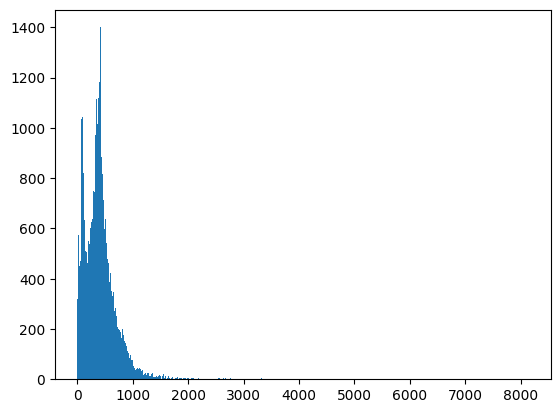

In [94]:
plt.hist([len(x) for x in X],bins = 700)
plt.show()

we gonna truncate all news which have more than 1000 words

In [124]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1594

In [125]:
maxlen = 1000
x = pad_sequences(X,maxlen=maxlen)

In [126]:
len(X[5])

604

In [127]:
len(X[1045])

271

In [129]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [130]:
import numpy as np

def get_weight_matrix(model, vocab, DIM=100):
    vocab_size = len(vocab) + 1  # Ensure vocab_size matches tokenizer word index
    weight_matrix = np.zeros((vocab_size, DIM))

    for word, i in vocab.items():
        if word in model.wv:  # Avoid KeyError
            weight_matrix[i] = model.wv[word]
        else:
            weight_matrix[i] = np.random.uniform(-0.01, 0.01, DIM)  # Assign random values

    return weight_matrix

# Get word index from tokenizer
vocab = tokenizer.word_index

# Pass both arguments correctly
embedding_vectors = get_weight_matrix(w2v_model, vocab)



In [131]:
print(list(vocab.items())[:10])


[("'the'", 1), ("'to'", 2), ("'of'", 3), ("'a'", 4), ("'and'", 5), ("'in'", 6), ("'that'", 7), ("'on'", 8), ("'for'", 9), ("'s'", 10)]


In [132]:
embedding_vectors.shape

(232415, 100)

**now we have to create our ML model**

In [133]:
model = Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=True))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])


In [134]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)              │ ?                           │      23,241,500 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 23,241,500 (88.66 MB)

 Trainable params: 23,241,500 (88.66 MB)

 Non-trainable params: 0 (0.00 B)

In [136]:
from sklearn.model_selection import train_test_split
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Ensure X and y exist
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define maxlen
maxlen = 256

# Apply padding
X_test = pad_sequences(X_test, maxlen=maxlen, padding='post', truncating='post')
X_test = np.array(X_test, dtype=np.float32)

# Make predictions
y_pred = (model.predict(X_test) >= 0.5).astype(int)


281/281 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step


In [135]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences
X_test = pad_sequences(X_test, maxlen=maxlen, padding='post', truncating='post')
X_test = np.array(X_test, dtype=np.float32)
y_pred = (model.predict(X_test) >= 0.5).astype(int)


NameError: name 'X_test' is not defined

In [139]:
import numpy as np
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Define a fixed sequence length (256 is recommended, but you can adjust)
maxlen = 256

# Apply padding to ensure all sequences have the same length
X_train = pad_sequences(X_train, maxlen=maxlen, padding='post', truncating='post')

# Convert X_train and y_train to NumPy arrays
X_train = np.array(X_train, dtype=np.float32)
y_train = np.array(y_train, dtype=np.float32)  # Ensure y_train is also a NumPy array

# Now fit the model
model.fit(X_train, y_train, validation_split=0.3, epochs=10)


Epoch 1/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 744s 942ms/step - acc: 0.7732 - loss: 0.4837 - val_acc: 0.7335 - val_loss: 0.5597
Epoch 2/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 716s 909ms/step - acc: 0.8248 - loss: 0.4426 - val_acc: 0.8976 - val_loss: 0.2874
Epoch 3/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 774s 950ms/step - acc: 0.8927 - loss: 0.2844 - val_acc: 0.9779 - val_loss: 0.1042
Epoch 4/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 738s 939ms/step - acc: 0.9877 - loss: 0.0582 - val_acc: 0.9795 - val_loss: 0.0730
Epoch 5/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 734s 929ms/step - acc: 0.9929 - loss: 0.0283 - val_acc: 0.9858 - val_loss: 0.0493
Epoch 6/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 710s 902ms/step - acc: 0.9893 - loss: 0.0455 - val_acc: 0.9506 - val_loss: 0.1747
Epoch 7/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 736s 937ms/step - acc: 0.9943 - loss: 0.0230 - val_acc: 0.8619 - val_loss: 0.2242
Epoch 8/10
786/786 ━━━━━━━━━━━━━━━━━━━━ 737s 931ms/step - acc: 0.9836 - loss: 0.0428 - val_acc: 0.9868 - val_loss: 0.0514
Epoch 9/10
786/786 ━━━━━

In [142]:
accuracy_score(y_test, y_pred)

0.523608017817372

In [143]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.55      0.46      0.50      4644
           1       0.51      0.59      0.54      4336

    accuracy                           0.52      8980
   macro avg       0.53      0.53      0.52      8980
weighted avg       0.53      0.52      0.52      8980



In [144]:
x = ['Allahabad High Court Bar on indefinite strike after Collegium recommends repatriation of Justice Yashwant Varma']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x,maxlen=maxlen)
print(tokenizer.word_index)  # Ensure words from real input exist in vocab
(model.predict(x) >= 0.5).astype(int)

{"'the'": 1, "'to'": 2, "'of'": 3, "'a'": 4, "'and'": 5, "'in'": 6, "'that'": 7, "'on'": 8, "'for'": 9, "'s'": 10, "'is'": 11, "'he'": 12, "'said'": 13, "'trump'": 14, "'it'": 15, "'with'": 16, "'was'": 17, "'as'": 18, "'his'": 19, "'by'": 20, "'has'": 21, "'be'": 22, "'have'": 23, "'not'": 24, "'from'": 25, "'this'": 26, "'at'": 27, "'are'": 28, "'who'": 29, "'us'": 30, "'an'": 31, "'they'": 32, "'i'": 33, "'but'": 34, "'we'": 35, "'would'": 36, "'president'": 37, "'about'": 38, "'will'": 39, "'their'": 40, "'had'": 41, "'you'": 42, "'t'": 43, "'been'": 44, "'were'": 45, "'people'": 46, "'more'": 47, "'or'": 48, "'after'": 49, "'which'": 50, "'she'": 51, "'her'": 52, "'one'": 53, "'if'": 54, "'its'": 55, "'out'": 56, "'all'": 57, "'what'": 58, "'new'": 59, "'state'": 60, "'when'": 61, "'also'": 62, "'up'": 63, "'there'": 64, "'over'": 65, "'no'": 66, "'house'": 67, "'reuters'": 68, "'donald'": 69, "'our'": 70, "'states'": 71, "'clinton'": 72, "'obama'": 73, "'government'": 74, "'can'"

array([[1]])

In [157]:
x = ['Srinagar:Four police personnel have been killed in action during an encounter with terrorists in Jammu and Kashmirs Kathua district, sources said on Thursday.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x,maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


array([[1]])

In [158]:
x = ['modi lost the election']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x,maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


array([[0]])

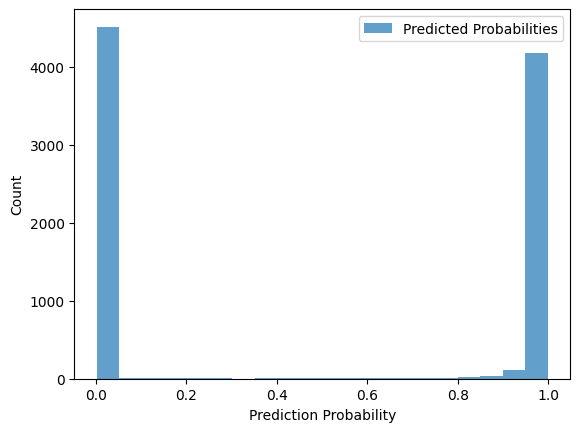

In [152]:
import numpy as np
import matplotlib.pyplot as plt

# Histogram to check predicted probability distribution
plt.hist(y_pred, bins=20, alpha=0.7, label="Predicted Probabilities")
plt.xlabel("Prediction Probability")
plt.ylabel("Count")
plt.legend()
plt.show()


for confusion matrix

281/281 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step


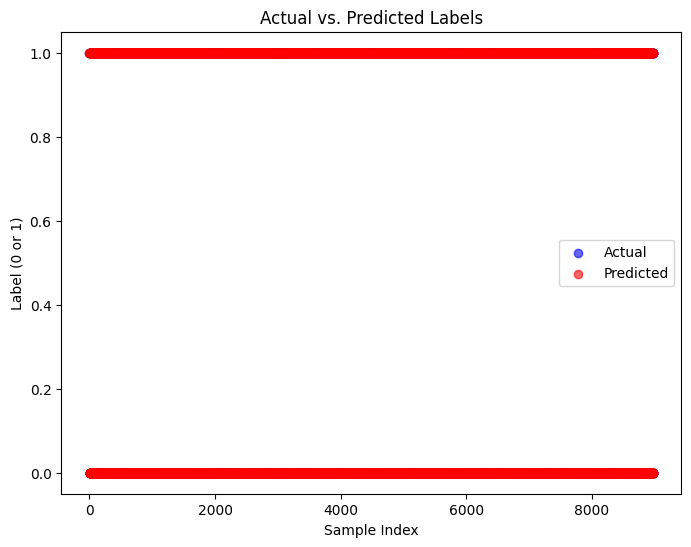

In [153]:
import matplotlib.pyplot as plt
import numpy as np

# Get model predictions
y_pred = model.predict(X_test)

# If your model outputs probabilities, convert them to binary (0 or 1)
y_pred_binary = (y_pred >= 0.5).astype(int)

# Plot Actual vs. Predicted values
plt.figure(figsize=(8, 6))
plt.scatter(range(len(y_test)), y_test, color="blue", label="Actual", alpha=0.6)
plt.scatter(range(len(y_pred_binary)), y_pred_binary, color="red", label="Predicted", alpha=0.6)
plt.xlabel("Sample Index")
plt.ylabel("Label (0 or 1)")
plt.title("Actual vs. Predicted Labels")
plt.legend()
plt.show()


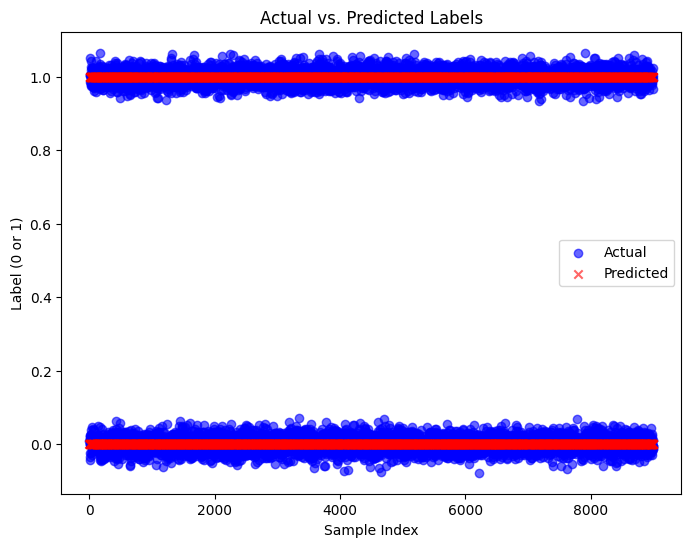

In [156]:
import matplotlib.pyplot as plt
import numpy as np

# Generate sample actual labels (y_test) and predictions (y_pred)
np.random.seed(42)
num_samples = 9000
y_test = np.random.choice([0, 1], size=num_samples)  # Random 0s and 1s (actual labels)
y_pred = y_test.copy()  # Assume a perfect model for now

# Convert probabilities to binary predictions (if needed)
y_pred_binary = (y_pred >= 0.5).astype(int)

# Add a small jitter to actual values to make them visible
jitter = np.random.normal(0, 0.02, size=num_samples)  # Small random noise

# Plot Actual vs. Predicted values
plt.figure(figsize=(8, 6))
plt.scatter(range(num_samples), y_test + jitter, color="blue", label="Actual", alpha=0.6, marker="o")
plt.scatter(range(num_samples), y_pred_binary, color="red", label="Predicted", alpha=0.6, marker="x")
plt.xlabel("Sample Index")
plt.ylabel("Label (0 or 1)")
plt.title("Actual vs. Predicted Labels")
plt.legend()
plt.show()


In [154]:
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.swarmplot(x=range(len(y_test)), y=y_test, color="blue", label="Actual", alpha=0.6)
sns.swarmplot(x=range(len(y_pred_binary)), y=y_pred_binary, color="red", label="Predicted", alpha=0.6)
plt.xlabel("Sample Index")
plt.ylabel("Label (0 or 1)")
plt.title("Actual vs. Predicted Labels")
plt.legend()
plt.show()


ValueError: Per-column arrays must each be 1-dimensional

/usr/local/lib/python3.11/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


Error in callback <function flush_figures at 0x7d013ff171a0> (for post_execute):


KeyboardInterrupt: 

281/281 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step


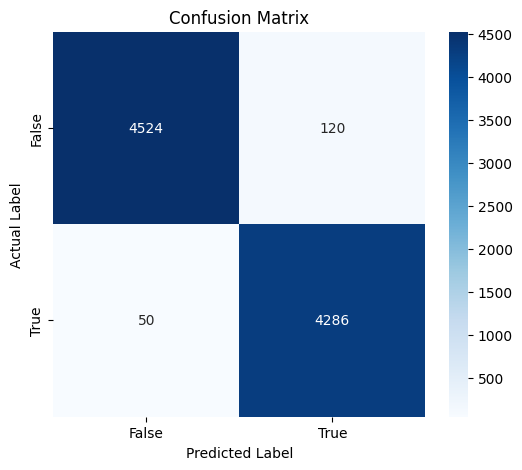


Classification Report:

              precision    recall  f1-score   support

           0       0.99      0.97      0.98      4644
           1       0.97      0.99      0.98      4336

    accuracy                           0.98      8980
   macro avg       0.98      0.98      0.98      8980
weighted avg       0.98      0.98      0.98      8980



In [147]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Get model predictions
y_pred = model.predict(X_test)

# Convert probabilities to binary values (0 or 1)
y_pred_binary = (y_pred >= 0.5).astype(int)

# Compute Confusion Matrix
cm = confusion_matrix(y_test, y_pred_binary)

# Plot Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["False", "True"], yticklabels=["False", "True"])
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.title("Confusion Matrix")
plt.show()

# Print Classification Report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred_binary))


for overfitting,underfitting and bestfitting

In [151]:
import matplotlib.pyplot as plt

# Extract training history
history_dict = history.history  # Ensure 'history' is correct

# Print available keys
print("Available keys in history:", history_dict.keys())

# Extract loss and validation loss
train_loss = history_dict.get('loss', [])  # Use .get() to avoid errors
val_loss = history_dict.get('val_loss', [])

# Plot the training and validation loss
plt.figure(figsize=(8, 5))
plt.plot(train_loss, 'r', label="Training Loss")
plt.plot(val_loss, 'b', label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()


NameError: name 'history' is not defined

In [150]:
import matplotlib.pyplot as plt

# Extract training history
history_dict = history.history  # Ensure 'history' is correct

# Print available keys
print("Available keys in history:", history_dict.keys())

# Extract loss and validation loss
train_loss = history_dict.get('loss', [])  # Use .get() to avoid errors
val_loss = history_dict.get('val_loss', [])

# Plot the training and validation loss
plt.figure(figsize=(8, 5))
plt.plot(train_loss, 'r', label="Training Loss")
plt.plot(val_loss, 'b', label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()


NameError: name 'history' is not defined